In [ ]:
!pip install torch torchvision torchaudio
!pip install matplotlib
!pip install opencv-python

> Let's try to classify the night images. 

Using cache found in /Users/akumanic/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2023-11-28 Python-3.11.5 torch-2.1.1 CPU

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 


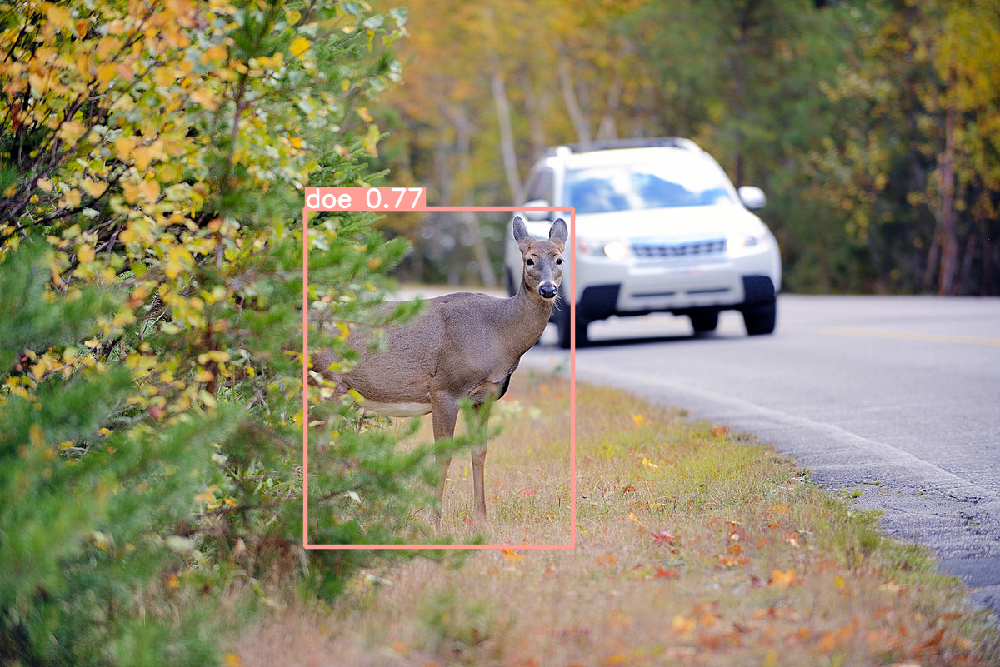

Saved 1 image to database_deer_with_cars_results/10.jpeg


Coordinates: [tensor(366.89426), tensor(250.07594), tensor(687.11194), tensor(656.33325)], Confidence: 0.7658933997154236, Class: 1.0


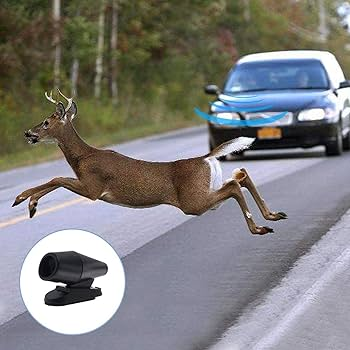

Saved 1 image to database_deer_with_cars_results/14.jpg


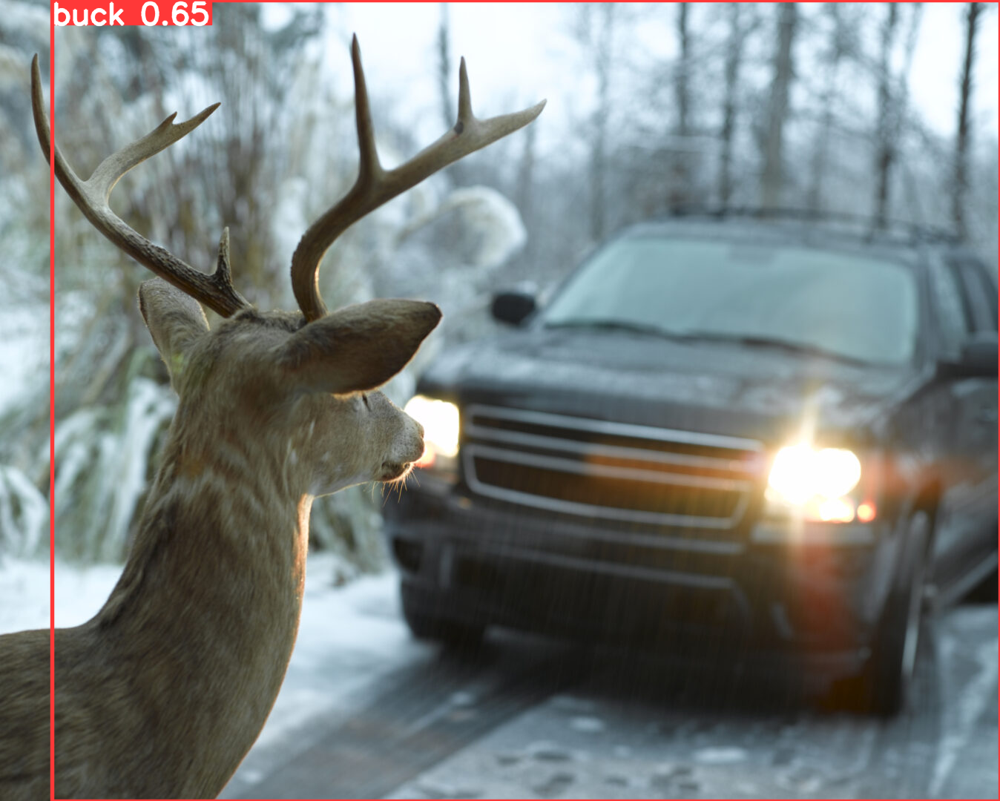

Saved 1 image to database_deer_with_cars_results/6.jpeg


Coordinates: [tensor(70.79445), tensor(0.), tensor(1348.), tensor(1080.)], Confidence: 0.6548205614089966, Class: 0.0


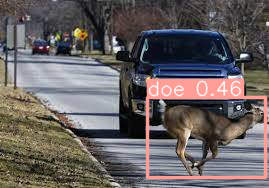

Saved 1 image to database_deer_with_cars_results/7.jpeg


Coordinates: [tensor(147.45107), tensor(97.64664), tensor(265.69653), tensor(177.19897)], Confidence: 0.4578544795513153, Class: 1.0


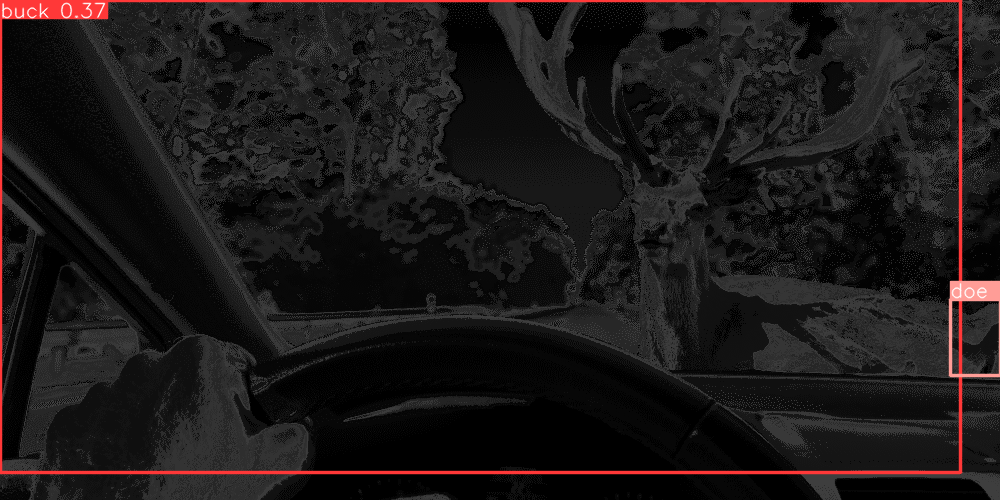

Saved 1 image to database_deer_with_cars_results/12.png


Coordinates: [tensor(950.94952), tensor(299.50488), tensor(1000.), tensor(375.90469)], Confidence: 0.5157415270805359, Class: 1.0
Coordinates: [tensor(0.), tensor(0.), tensor(960.59344), tensor(472.47717)], Confidence: 0.3682832419872284, Class: 0.0


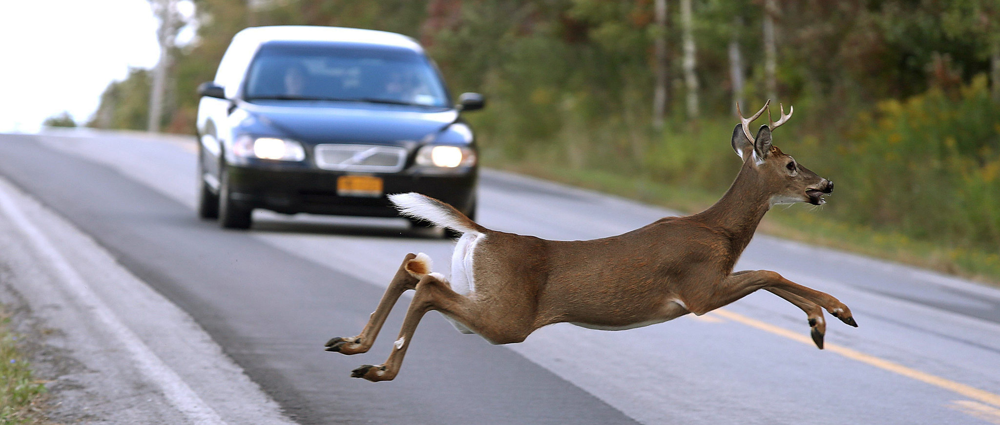

Saved 1 image to database_deer_with_cars_results/2.jpeg


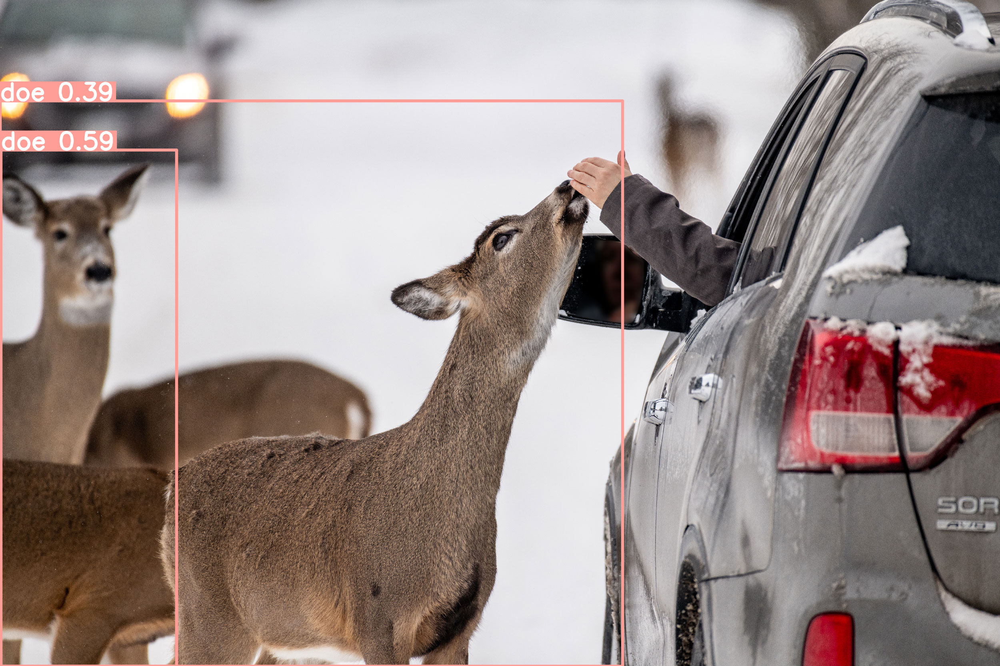

Saved 1 image to database_deer_with_cars_results/13.jpeg


Coordinates: [tensor(2.34482), tensor(375.32022), tensor(441.90021), tensor(1667.)], Confidence: 0.5915229320526123, Class: 1.0
Coordinates: [tensor(0.), tensor(252.60033), tensor(1556.72021), tensor(1667.)], Confidence: 0.3855593204498291, Class: 1.0


In [1]:
import torch
import os
from PIL import Image

# Load the model
model = torch.hub.load('ultralytics/yolov5', 'custom', path='best.pt')  

# Define the path to the images directory
images_directory = 'database_deer_with_cars'
output_directory = 'database_deer_with_cars_results'

# Create the output directory if it doesn't exist
if not os.path.exists(output_directory):
    os.makedirs(output_directory)

# List all files in the directory
image_files = [os.path.join(images_directory, file) for file in os.listdir(images_directory) if file.endswith(('.jpg', '.png', '.jpeg'))]

# Perform inference on each image
for image_path in image_files:
    # Load your image
    img = Image.open(image_path)
    
    # Perform inference
    results = model(img)

    # Display the image with bounding boxes and labels
    results.show()
    
    # Save the results
    save_path = os.path.join(output_directory, os.path.basename(image_path))
    results.save(save_dir=save_path)

    # To get the bounding box coordinates, confidence and class
    for *xyxy, conf, cls in results.xyxy[0]:
        print(f'Coordinates: {xyxy}, Confidence: {conf}, Class: {cls}')




Overall - good, the boundaries between the deer and car could use some improvements with more training in the future. 